In [1]:
### Cell Type Annotation
# 'here there be dragons'
# Cell Type Annotation is the process of adding cell types to clusters to turn findings about groups of unknown cells
# into biological insights. Note: this is not the only kind of annotation you can do, you can annotate based
# on sex, disease, batch, etc, but this is likely to be the most universal of annotations conducted in 
# scRNA-seq analysis.
# suffice to say, this process can be challenging to do and this notebook will cover 2 major methods of 
# cell type annotation: manual and automated

In [2]:
# env setup: here I am suppressing warnings that are not relevant to the analysis we want to conduct
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)


In [3]:
# pip install celltypist scarches

In [4]:
import urllib.request
from pathlib import Path

import celltypist
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scarches as sca
import seaborn as sns
from celltypist import models
from scipy.sparse import csr_matrix

In order to use the mouse gastrulation seqFISH datsets, please install squidpy (see https://github.com/scverse/squidpy).
In order to use sagenet models, please install pytorch geometric (see https://pytorch-geometric.readthedocs.io) and 
 captum (see https://github.com/pytorch/captum).
mvTCR is not installed. To use mvTCR models, please install it first using "pip install mvtcr"
multigrate is not installed. To use multigrate models, please install it first using "pip install multigrate".


In [5]:
# filter pandas performance warnings 
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [6]:
sc.set_figure_params(figsize=(5, 5))
adata = sc.read(filename="s4d8_clustered.h5ad")

In [7]:
### Manual Annotation
# considered the classical method of cell type annotation, here, using a selection of marker genes,
# we will look for clusters that express marker genes for one cell type and call that cluster by the cell
# type who's markers it expresses.
# This is a great method when clear markers of cell identity exist, but when there is no single marker 
# of cell identity this gets messy fast, because suddely the process becomes very subjective
# Clusetring before annotaion helps in two major ways: 1) we can label a whole cluster
# rather than having to individually label each cell. 2) looking at a clusters expression profile rather 
#than a single cell's expression profile makes the label more robust to expression noise

In [8]:
### Annotation from markers
# this approach uses known markers of cells to assign cell types. Start by listing a set of markers
# for cell types (based on the fact that this is a bone marrow data set, we can be pretty specific
# about the gene expressions we check for )
# note: because transcription is not translation, you should focus on using markers from RNA-based 
# papers rather than protein based papers
# 

In [9]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [10]:
# no need to check for markers if they don't exist, so remove markers that aren't in our adata object
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [11]:
# we can use a 2d projection to visualize the marker expressions (color a UMAP based on expression)
# so we construct a UMAP, using scran normalized counts, for highly divergrent genes

In [12]:
adata.layers["counts"] = adata.X # save counts to a layer in case we need them later
adata.X = adata.layers["scran_normalization"] # then set X to our normalized data

In [13]:
# because scanpy defaults to using .var['highly_variable'], we need to set this to the 
# deviant genes
adata.var["highly_variable"] = adata.var["highly_deviant"]

In [14]:
# perform the PCA using our dviant genes. Use the deviant genes to focus the PCA on the genes that
# are most likely to be 'interesting' in further analysis
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)

In [15]:
sc.pp.neighbors(adata) # generate neighbor graph based on PCs

In [16]:
sc.tl.umap(adata) # use the neighbor graph to generate a 2D UMAP for the data

In [17]:
# now onto using our markers to color UMAPs to identify cell types
# first B/plasma cell subtypes. First list the B cell subtypes of interest 
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]

NAIVE CD20+ B:


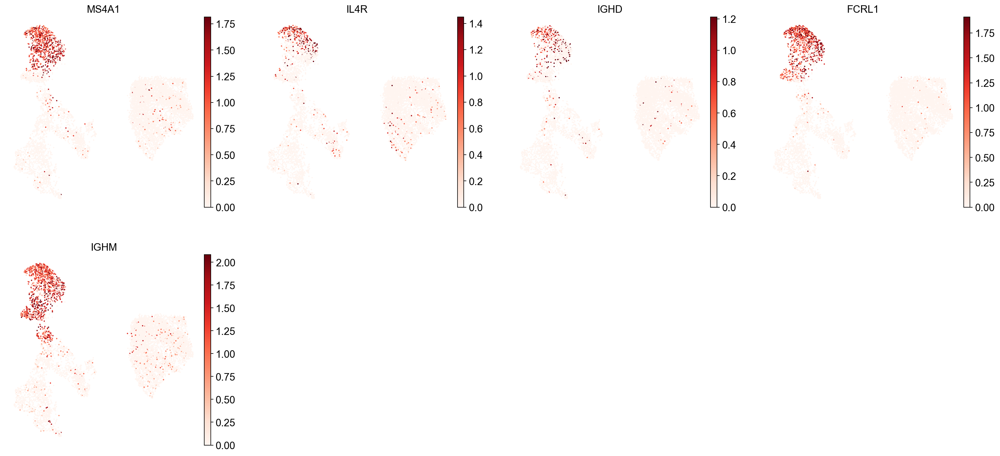





B1 B:


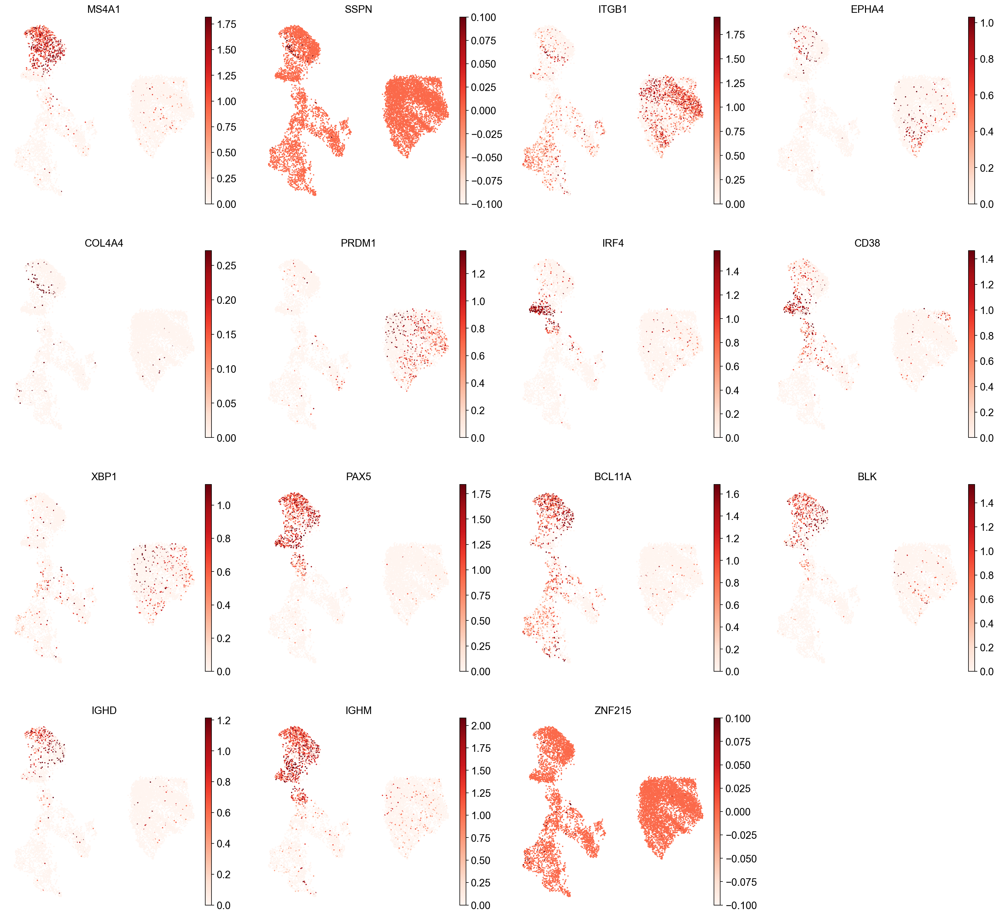





TRANSITIONAL B:


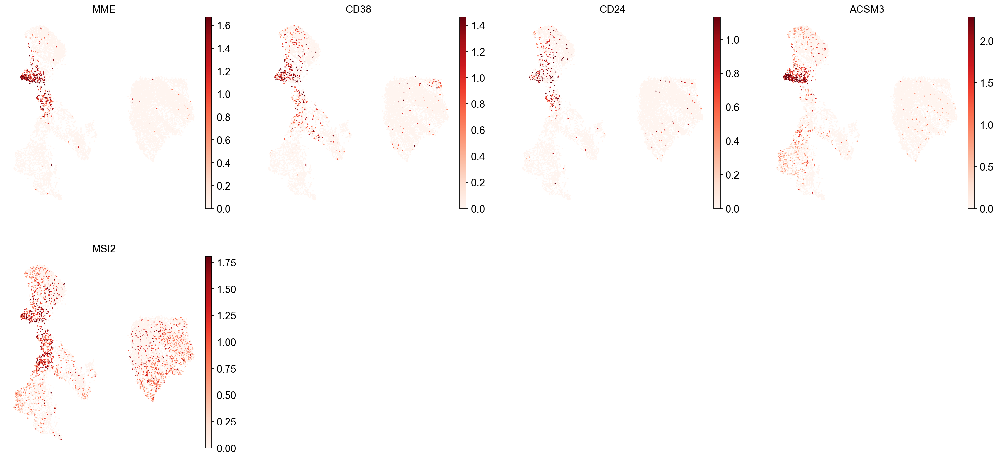





PLASMA CELLS:


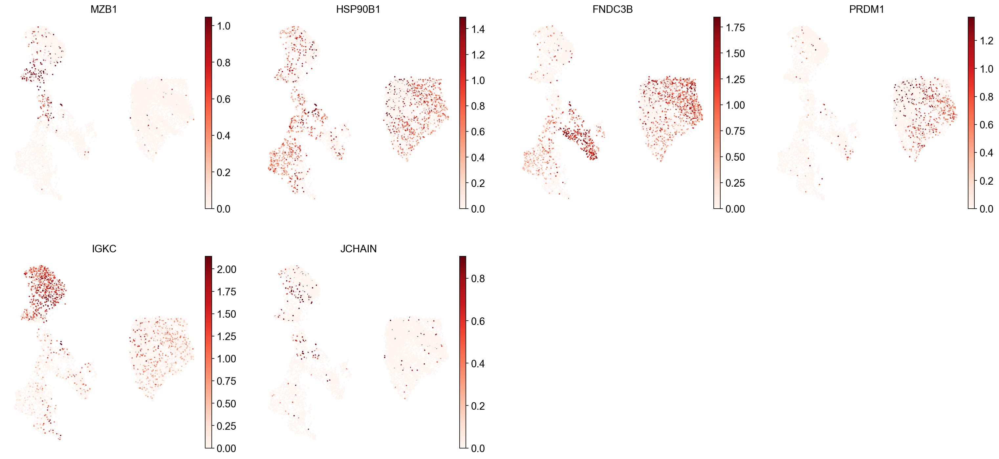





PLASMABLAST:


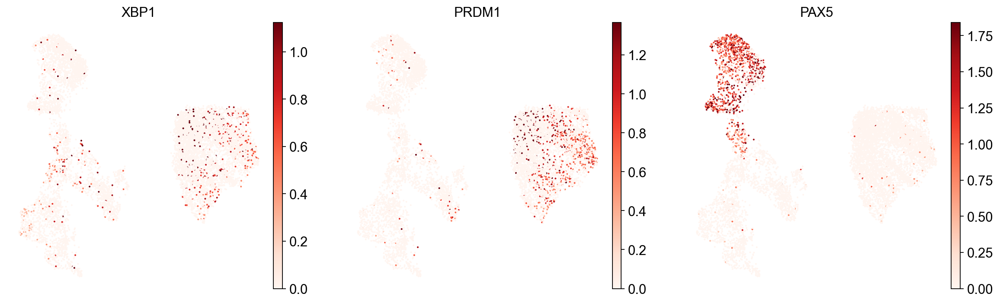

In [18]:
# now, we plot one UMAP per marker for each of the B cell subtypes
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [19]:
# from the plots above it should be clear that markers, even those for a single cell type, are often
# expressed in different sets of the data (individual markers are often not uniquely expressed)
# instead we must look for intersections of subsets to determine where the cell type of interest is

# Another major point: marker cells are often sparsely expressed. it is often only a subset of cells
# of a given type that amarker was detected in. This is an inherit aspect of the nature of scRNA-seq
# because only a subset of the total RNA in a cell is sequenced, meaning that we will not always 
# sample transcripts from specific genes in a cell even if they were expressed there. This is why
# sc data is not, or should not be, annotated based on minimum expression threshold. 
# Instead we partition the data into groups of similar cells by clustering, so we can account for 
# missing transcripts by grouping based on overal stranscriptomic similarity

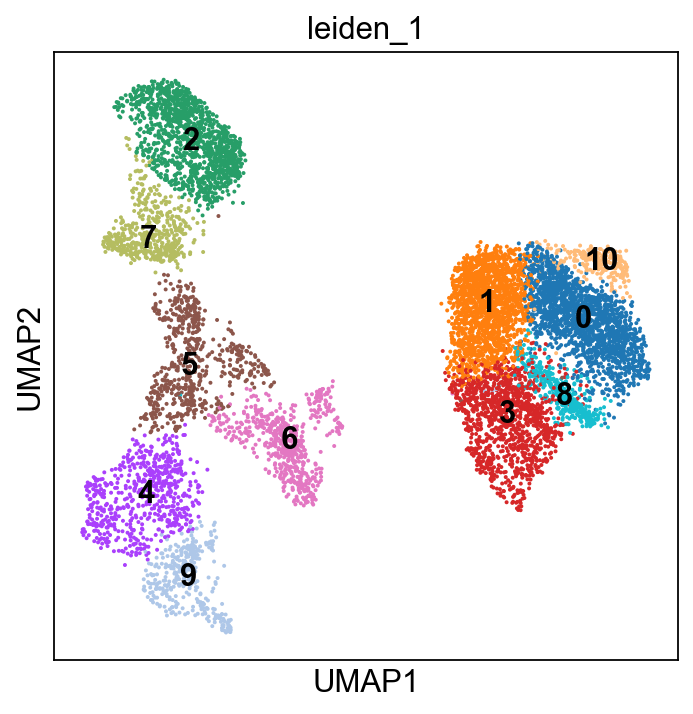

In [20]:
# now cluster the data, using the leiden alg, then plot the clusters on a umap
sc.tl.leiden(adata, resolution=1, key_added="leiden_1")
sc.pl.umap(adata, color='leiden_1', legend_loc="on data")

In [21]:
# this is a relatively coarse clustering map, so we could up the resolution of the leiden alg
# to see if we can better match the umap to the cell annotations 
sc.tl.leiden(adata, resolution=2, key_added='leiden_2')

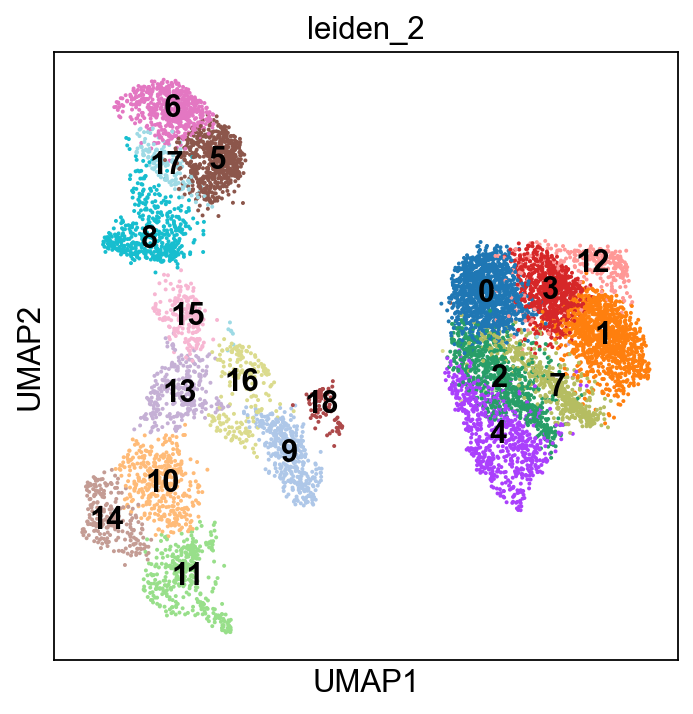

In [22]:
sc.pl.umap(adata, color='leiden_2', legend_loc="on data")

In [23]:
# something to note, it can be very challenging to line up the dots between leiden clusters and 
# marker expression maps, so we can plot these values against each other
B_plasma_markers = {ct: [m for m in ct_markers if m in adata.var.index] 
                    for ct, ct_markers in marker_genes.items()
                    if ct in B_plasma_cts
                   }

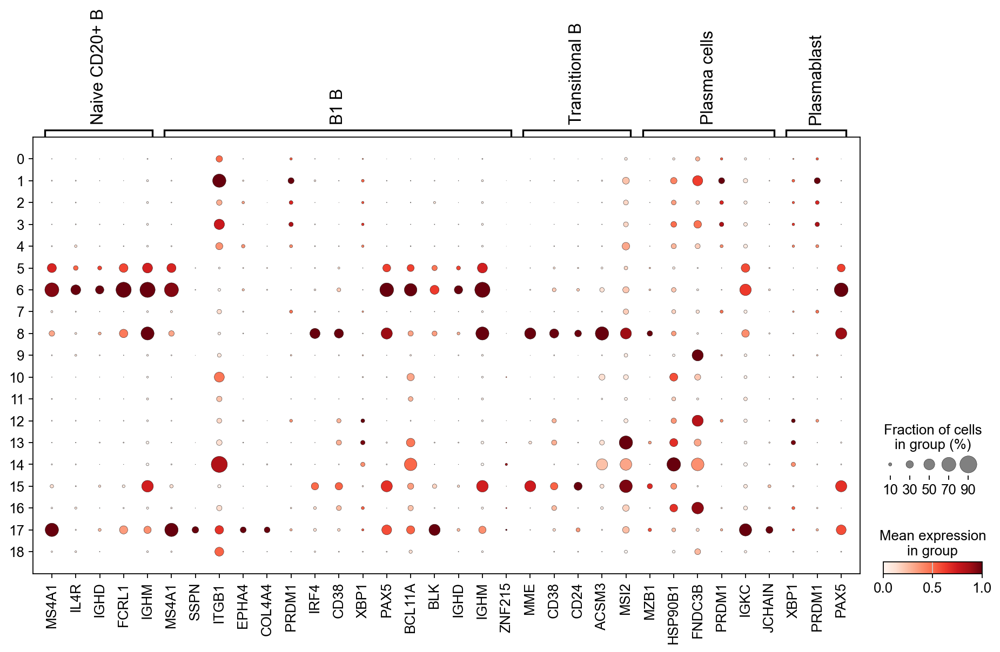

In [24]:
# standard scale normalizes each gene to range from 0-1
sc.pl.dotplot(
    adata, 
    groupby='leiden_2', 
    var_names=B_plasma_markers, 
    standard_scale="var" 
)
    

In [25]:
# now using the dot plot and the UMAPS, we can start assigning clusters
cl_annotation = {
    "5": "Naive CD20+ B",
    "6": "Naive CD20+ B",
    "8": "Transitional B",
    "16": "Transitional B",
    "17": "B1 B",  # note that IGHD and IGHM are negative markers
}
#Note: plasmablasts and plasma cells have no clear cluster where all of their markes are highly
# expressed, so they have been left out
# (this is part of the judgement call nature of sc annotations) You may also note that B1 B cells are
# a pretty tricky group to place, both of these findings are indicative that markers that work
# well for one dataset do not always work well for others. This can be due to seq depth, or other 
# variations between datasets/samples

... storing 'manual_celltype_annotation' as categorical


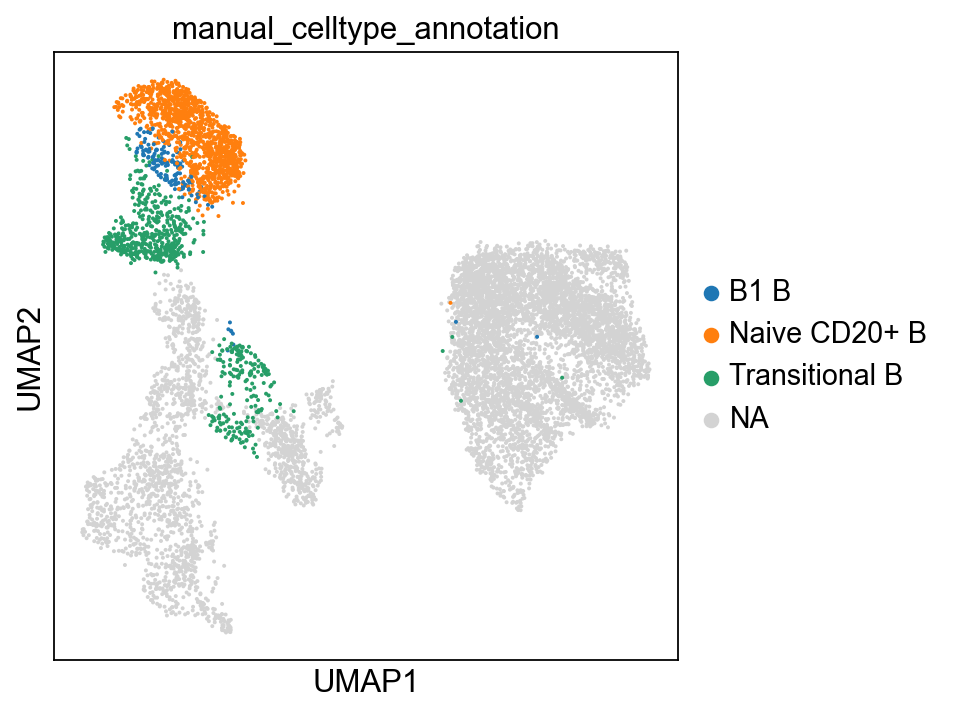

In [26]:
# add our observatoins to the adata object, then visualize
adata.obs["manual_celltype_annotation"] = adata.obs["leiden_2"].map(cl_annotation)
sc.pl.umap(adata, color=["manual_celltype_annotation"])

In [27]:
### Clustering using differentially expressed genes
# an alternative approach is to determine arer gene expression per cluster and then determine whether
# we can link those marker genes to known biology. simple clustering methods are preferred for this
# analysis,  such as Wilcoxon rank-sum tests. Note: because te definition of the clusters is based 
# on the same data that is used for these statistical tests, the p-value of these tests will be 
# inflated.

In [28]:
# first we calculate the differentially xpressed genes for every cluster, compared to the other 
# clusters
sc.tl.rank_genes_groups(adata, groupby='leiden_2', method='wilcoxon', key_added='dea_leiden_2')

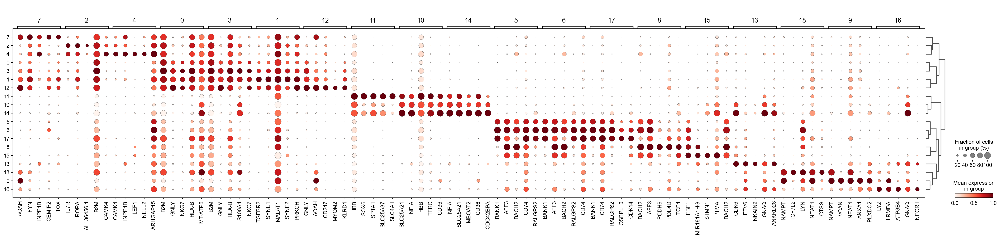

In [29]:
# next, we can visualize expression of the top differentially express genes per cluster
sc.pl.rank_genes_groups_dotplot(adata, groupby='leiden_2', standard_scale='var', n_genes=5,
                                key='dea_leiden_2')

In [30]:
#  many DEGs are highly expressed in multiple clusters. This can be filtered to 
# select for more cluster specific DEGs
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.2, max_out_group_fraction=0.2,
                               key='dea_leiden_2', key_added='dea_leiden_2_filtered')

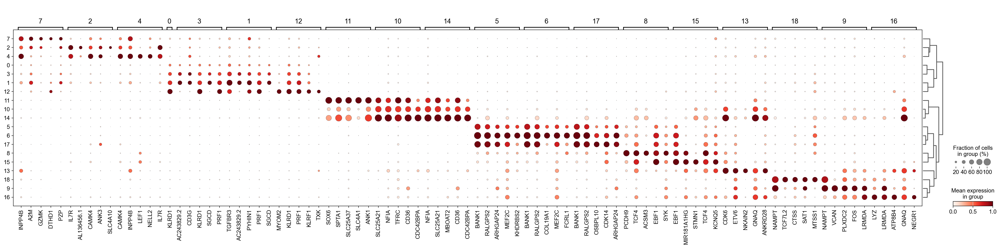

In [31]:
sc.pl.rank_genes_groups_dotplot(adata, groupby='leiden_2', standard_scale='var', n_genes=5,
                                key='dea_leiden_2_filtered')

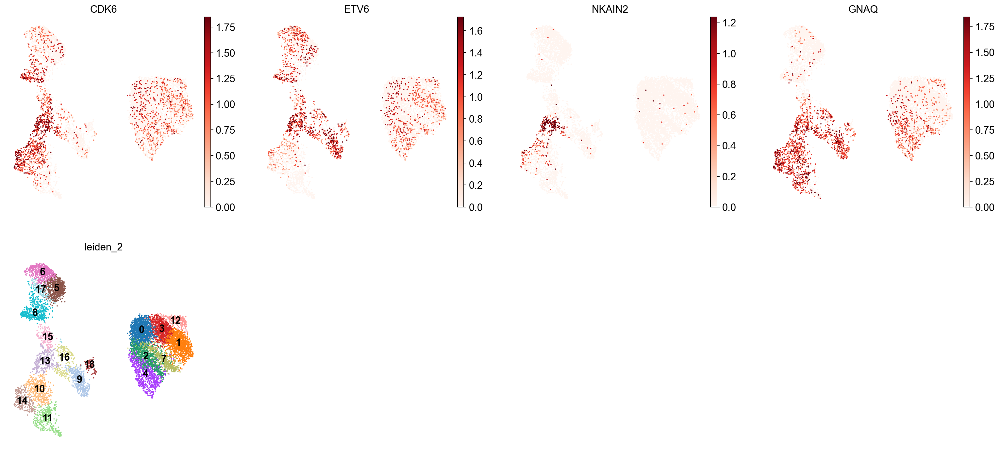

In [32]:
# This looks much cleaner and clusters that have relatively unique expression are popping out
# lets take a look at 13 for instance, expressing: CDK6, ETV6, NKAIN2, and GNAQ. From our list above, 
# NKAIN is a marker for hematopoietic stem cells, googling tells us that ETV6 is one as well.
sc.pl.umap(adata, color=["CDK6", "ETV6", "NKAIN2", "GNAQ", "leiden_2"],
           vmax="p99", legend_loc="on data", frameon=False, cmap="Reds")
# from this umap we see that expression for these markers is varied, but strong in cluster 13

In [33]:
# This example should highlight how complicated marker based annotatoin is. It is sensitive to cluster 
# resolution, robustness of markers, uniqueness of markers, and critically your knowledge of the cell 
# types to be expected in the data (importantly this means you will miss all cells you don't know could be 
# there)
# For these reasons, work is being done to move from purely manual cluster annotations to automated and 
# semi-automated annotation alogirthms. Before treating with those options, save annotations to our adata
cl_annotation["13"] = "HSCs"
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

In [34]:
### Automated Annotation
# these methods are largely unsupervised and use a variety of methods to make celltype assignments, as 
# such, the celltypes returned by these methods should be treated as a starting piont, rather than an end
# point of annotation.
# Annotatoin ability is largely dependent on the classifier that is used, with training data playing an 
# important role in the classifiers ability to distinguish celltypes in the dataset. For the best results 
# it is important to use a classifier that was trained on data that is as similar to your data as possible
# (i.e. same technique, multiple datasets, etc)

In [35]:
### Marker gene based classifiers
# this type of classifier relies on a predefined set of marker genes to determine celltype. 
# Advantages: transparent, we know which genes lead to the classification
# disadvantages: likely to be affected by batch effect differences between the data the model was trained 
# on and the data that needs to be labeled.

In [36]:
### wide or whole gene set classifiers
# these classifiers take in a large number of genes to make a celltype decision. 

In [37]:
# using the celltypist model
adata_celltypist = adata.copy() # copy the dataset
adata_celltypist.X = adata.layers["counts"] #set adata.X to raw counts
sc.pp.normalize_total(adata_celltypist, target_sum=10**4) # normalize to 10k counts per cell
sc.pp.log1p(adata_celltypist) # log transform normalized data 
# for celltypist compatibility, convert to a denxe matrix
adata_celltypist.X = adata_celltypist.X.toarray()

In [38]:
# download the celltypist model for immune cells
models.download_models(force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"])

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /Users/martinra4/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [39]:
# the high and low in the model names indicate finer (low) and coarser (high) annotation levels. This is 
# a bit confusing because it refers to Low Hierarchy and High Hierarchy, not low and high resolution as
# may be expected
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [40]:
# now we can see which cell types are included in each model level
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [41]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [42]:
# now we can run the models on our data 
predictions_high = celltypist.annotate(adata_celltypist, model=model_high, majority_voting=True)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [65]:
# transform predictioesn to adata to get the full output
predictions_high_adata = predictions_high.to_adata()
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

In [45]:
# do the same for finer annotations
predictions_low = celltypist.annotate(adata_celltypist, model=model_low, majority_voting=True)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [66]:
predictions_low_adata = predictions_low.to_adata()
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

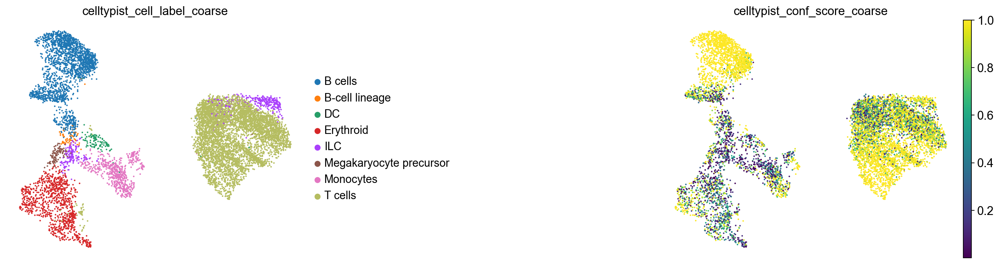

In [67]:
# now we can plot and compare
sc.pl.umap(adata,color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
           frameon=False,
           sort_order=False,
           wspace=1)

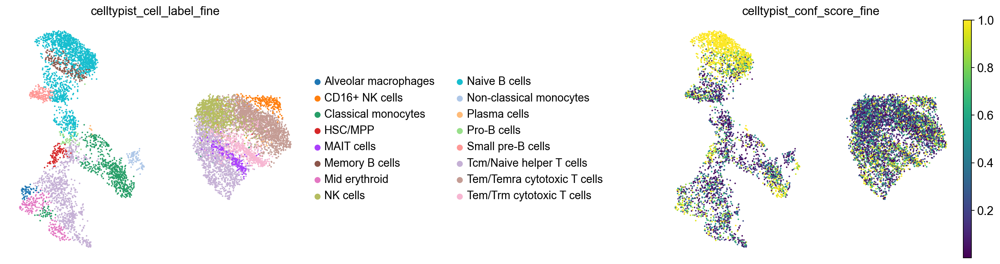

In [68]:
sc.pl.umap(adata,color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
           frameon=False,
           sort_order=False,
           wspace=1)

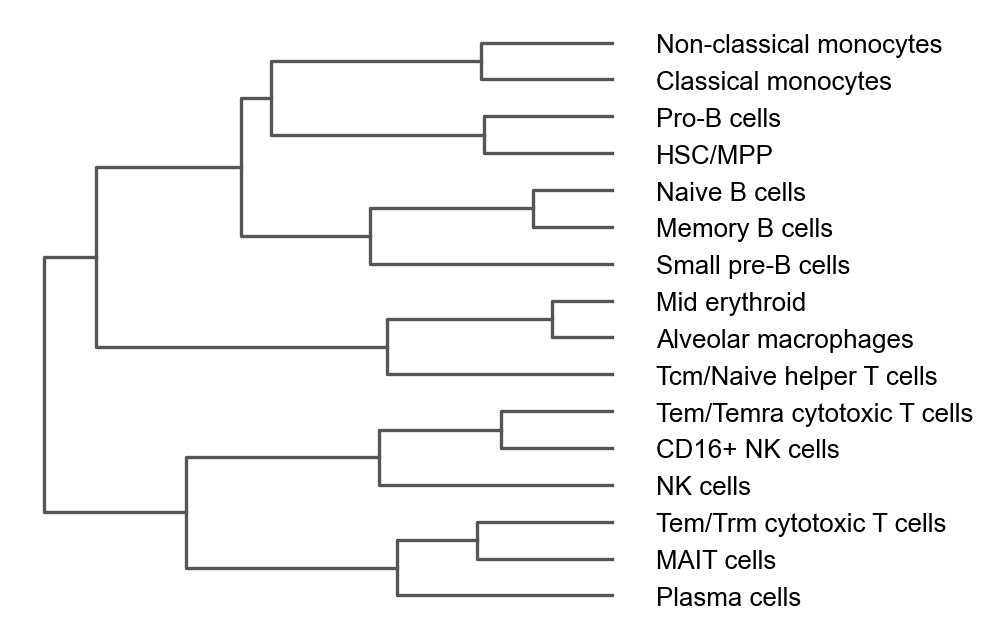

<Axes: >

In [69]:
# aside from using confidence scores, we can assess the quality of annotations by looking at 
# observed cell type similarities
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine",orientation='left')

In [70]:
# note: b cells largely cluster together (which matches expectations), but T cells are clustering with
# erythroid cells which is a red flag for poor celltyping of these cells

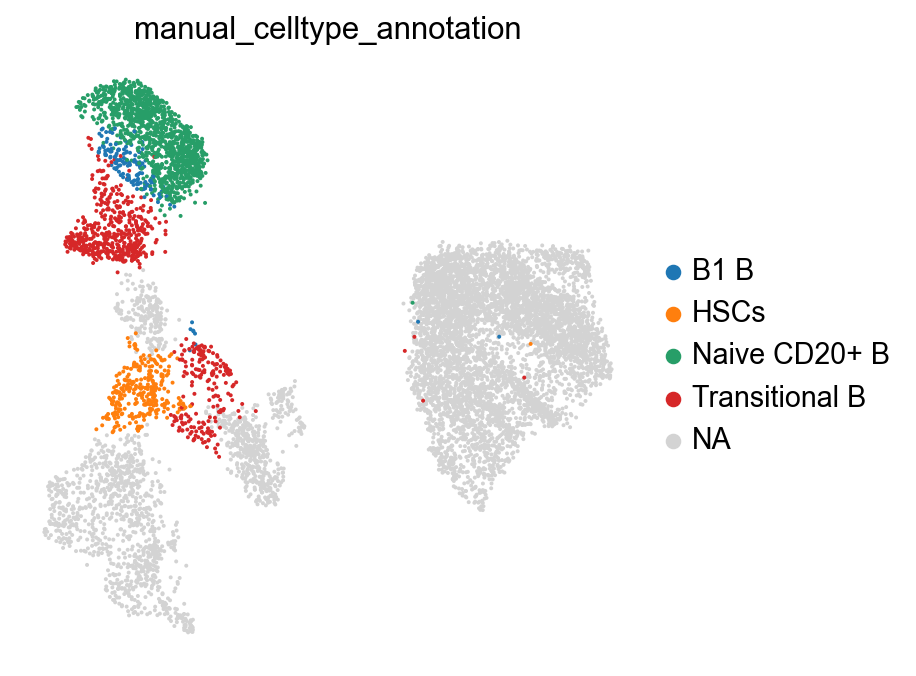

In [71]:
# checking our previous manual celltyping 
sc.pl.umap(adata, color=['manual_celltype_annotation'], frameon=False)

In [72]:
# we see that our B cell classifications largely line up with the classifications from celltypist, but 
# the fine labels of cluster 13 to see what is happening with the cells
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_fine).loc["13",:].sort_values(ascending=False)

celltypist_cell_label_fine
Tcm/Naive helper T cells       145
HSC/MPP                        104
Pro-B cells                     42
Classical monocytes              2
Alveolar macrophages             0
CD16+ NK cells                   0
MAIT cells                       0
Memory B cells                   0
Mid erythroid                    0
NK cells                         0
Naive B cells                    0
Non-classical monocytes          0
Plasma cells                     0
Small pre-B cells                0
Tem/Temra cytotoxic T cells      0
Tem/Trm cytotoxic T cells        0
Name: 13, dtype: int64

In [63]:
# the pattern in the coarse labeling is different: now instead of Tcell and HSC, we see ILCs and 
# megakaryocytes, with some B cells. this highlights a critical issues with automated annotation: it is
# is not self-consistent and can be contradictory on the same data.
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_coarse).loc["13", :].sort_values(ascending=False)

celltypist_cell_label_coarse
ILC                        139
Megakaryocyte precursor    104
B-cell lineage              42
Erythroid                    6
DC                           1
Monocytes                    1
B cells                      0
T cells                      0
Name: 13, dtype: int64